In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pp

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/30-days-of-ml/sample_submission.csv
/kaggle/input/30-days-of-ml/train.csv
/kaggle/input/30-days-of-ml/test.csv


# Load Data

In [2]:
train = pd.read_csv("train.csv")

train["kfold"] = -1
fold_counts = 4

kf = KFold(n_splits=fold_counts, shuffle=True, random_state=42)
for fold, (train_indicies, valid_indicies) in enumerate(kf.split(X=train)):
    train.loc[valid_indicies, "kfold"] = fold
train.to_csv("30 days of ML fold_counts.csv", index=False)

In [3]:
df = pd.read_csv("30 days of ML fold_counts.csv")
test = pd.read_csv("test.csv")
submit = pd.read_csv("sample_submission.csv")

In [4]:
train.head(10)

,id,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target,kfold
0,1,B,B,B,C,B,B,A,E,C,...,0.160266,0.310921,0.389470,0.267559,0.237281,0.377873,0.322401,0.869850,8.113634,0
1,2,B,B,A,A,B,D,A,F,A,...,0.558922,0.516294,0.594928,0.341439,0.906013,0.921701,0.261975,0.465083,8.481233,1
2,3,A,A,A,C,B,D,A,D,A,...,0.375348,0.902567,0.555205,0.843531,0.748809,0.620126,0.541474,0.763846,8.364351,3
3,4,B,B,A,C,B,D,A,E,C,...,0.239061,0.732948,0.679618,0.574844,0.346010,0.714610,0.540150,0.280682,8.049253,2
4,6,A,A,A,C,B,D,A,E,A,...,0.420667,0.648182,0.684501,0.956692,1.000773,0.776742,0.625849,0.250823,7.972260,1
5,7,A,B,A,C,B,D,A,E,G,...,0.658169,0.997473,0.569874,0.960864,0.238050,0.316065,0.731729,0.694719,8.028558,3
6,8,B,A,A,A,B,D,A,E,C,...,0.273454,0.824573,0.656325,0.677114,0.808445,0.615973,0.631677,0.283561,7.811465,0
7,9,A,A,A,C,B,B,A,E,A,...,0.339760,0.802006,1.010997,0.391221,0.057297,0.591120,0.074629,0.775869,7.674188,3
8,10,A,B,A,C,B,D,A,E,G,...,0.414036,0.809142,1.013301,0.761183,1.041711,0.393960,0.782381,0.865610,8.090095,2
9,11,A,A,A,A,B,B,A,E,E,...,0.233705,0.493036,0.353048,0.334675,0.085087,0.230634,0.636732,0.291874,8.446155,1


In [5]:
test.head(10)

,id,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,...,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13
0,0,B,B,B,C,B,B,A,E,E,...,0.476739,0.376350,0.337884,0.321832,0.445212,0.290258,0.244476,0.087914,0.301831,0.845702
1,5,A,B,A,C,B,C,A,E,C,...,0.285509,0.860046,0.798712,0.835961,0.391657,0.288276,0.549568,0.905097,0.850684,0.693940
2,15,B,A,A,A,B,B,A,E,D,...,0.697272,0.683600,0.404089,0.879379,0.275549,0.427871,0.491667,0.384315,0.376689,0.508099
3,16,B,B,A,C,B,D,A,E,A,...,0.719306,0.777890,0.730954,0.644315,1.024017,0.391090,0.988340,0.411828,0.393585,0.461372
4,17,B,B,A,C,B,C,A,E,C,...,0.313032,0.431007,0.390992,0.408874,0.447887,0.390253,0.648932,0.385935,0.370401,0.900412
5,19,B,B,B,C,B,B,A,E,E,...,0.489711,0.533519,0.451563,0.513817,0.429349,0.489093,0.326913,0.440908,0.694076,0.444859
6,20,A,A,A,C,B,D,A,E,G,...,0.285503,0.497190,0.540631,0.521383,0.277155,0.837442,0.602099,1.057592,0.522523,0.668214
7,21,B,B,A,C,B,D,A,E,A,...,0.346929,0.774717,0.374756,0.838619,0.641282,0.854445,0.834690,0.347269,0.741068,0.257963
8,23,A,A,A,C,B,B,A,E,E,...,0.484546,0.688881,0.356810,0.732911,0.259619,0.275222,0.750423,0.783911,0.601736,0.811545
9,29,A,A,A,C,B,D,A,E,A,...,0.425122,0.758756,0.706094,0.871956,0.584765,0.550189,0.775375,0.798391,0.972790,0.283684


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 27 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      300000 non-null  int64  
 1   cat0    300000 non-null  object 
 2   cat1    300000 non-null  object 
 3   cat2    300000 non-null  object 
 4   cat3    300000 non-null  object 
 5   cat4    300000 non-null  object 
 6   cat5    300000 non-null  object 
 7   cat6    300000 non-null  object 
 8   cat7    300000 non-null  object 
 9   cat8    300000 non-null  object 
 10  cat9    300000 non-null  object 
 11  cont0   300000 non-null  float64
 12  cont1   300000 non-null  float64
 13  cont2   300000 non-null  float64
 14  cont3   300000 non-null  float64
 15  cont4   300000 non-null  float64
 16  cont5   300000 non-null  float64
 17  cont6   300000 non-null  float64
 18  cont7   300000 non-null  float64
 19  cont8   300000 non-null  float64
 20  cont9   300000 non-null  float64
 21  cont10  30

In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 25 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      200000 non-null  int64  
 1   cat0    200000 non-null  object 
 2   cat1    200000 non-null  object 
 3   cat2    200000 non-null  object 
 4   cat3    200000 non-null  object 
 5   cat4    200000 non-null  object 
 6   cat5    200000 non-null  object 
 7   cat6    200000 non-null  object 
 8   cat7    200000 non-null  object 
 9   cat8    200000 non-null  object 
 10  cat9    200000 non-null  object 
 11  cont0   200000 non-null  float64
 12  cont1   200000 non-null  float64
 13  cont2   200000 non-null  float64
 14  cont3   200000 non-null  float64
 15  cont4   200000 non-null  float64
 16  cont5   200000 non-null  float64
 17  cont6   200000 non-null  float64
 18  cont7   200000 non-null  float64
 19  cont8   200000 non-null  float64
 20  cont9   200000 non-null  float64
 21  cont10  20

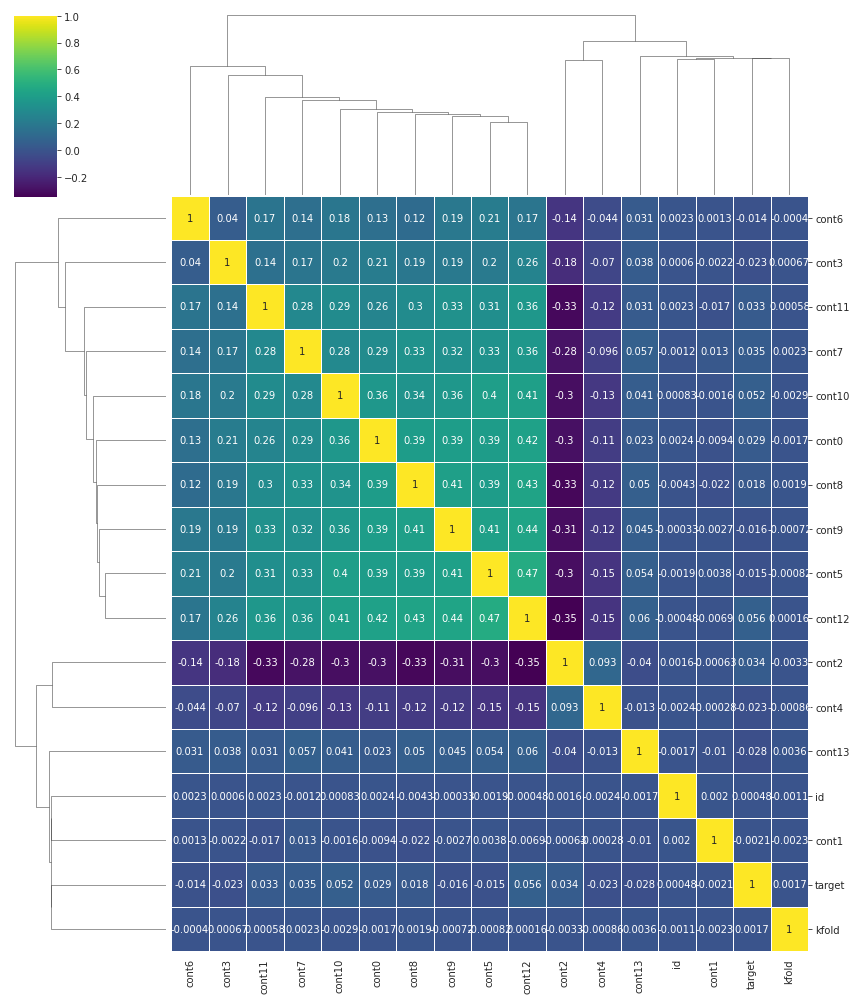

In [8]:
sns.set_style("darkgrid")
sns.clustermap(train.corr(), annot=True, linewidths=.5, cmap='viridis', figsize=(12,14))

In [9]:
pp.ProfileReport(train)

Summarize dataset:   0%|          | 0/40 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Prepare the data

In [10]:
required_features = [col for col in df.columns if col not in ('id', 'target', 'kfold')]

object_cols = [col for col in required_features if 'cat' in col]

test = test[required_features]

In [11]:
final = []

for fold in range(fold_counts):
    x_train = df[df.kfold != fold].reset_index(drop=True)
    x_valid = df[df.kfold == fold].reset_index(drop=True)
    
    x_test = test.copy()
    
    y_train = x_train.target
    y_valid = x_valid.target
    
    x_train = x_train[required_features]
    x_valid = x_valid[required_features]
    
    #OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
    #OH_cols_xtrain = pd.DataFrame(OH_encoder.fit_transform(x_train[object_cols]))
    #OH_cols_xvalid = pd.DataFrame(OH_encoder.transform(x_valid[object_cols]))
    #OH_cols_xtest = pd.DataFrame(OH_encoder.transform(x_test[object_cols]))
    
    #OH_cols_xtrain.index = x_train.index
    #OH_cols_xvalid.index = x_valid.index
    #OH_cols_xtest.index = x_test.index
    
    #num_x_train = x_train.drop(object_cols, axis=1)
    #num_x_valid = x_valid.drop(object_cols, axis=1)
    #num_x_test = x_test.drop(object_cols, axis=1)
    
    #OH_x_train = pd.concat([num_x_train, OH_cols_xtrain], axis=1)
    #OH_x_valid = pd.concat([num_x_valid, OH_cols_xvalid], axis=1)
    #OH_x_test = pd.concat([num_x_test, OH_cols_xtest], axis=1)
    
    encoder = OrdinalEncoder()
    x_train[object_cols] = encoder.fit_transform(x_train[object_cols])
    x_valid[object_cols] = encoder.transform(x_valid[object_cols])
    x_test[object_cols] = encoder.transform(x_test[object_cols])

# Train a model

In [12]:
xgb_params = {
    'random_state': 1, 
    'n_jobs': 3,
    'booster': 'gbtree',
    'n_estimators': 10000,
    'learning_rate': 0.034682894846408095,
    'reg_lambda': 1.224383455634919,
    'reg_alpha': 36.043214512614476,
    'subsample': 0.9219010649982458,
    'colsample_bytree': 0.11247495917687526,
    'max_depth': 3,
    'min_child_weight': 6
}

In [13]:
model = XGBRegressor(**xgb_params, tree_method = 'gpu_hist')
model.fit(
        x_train, y_train,
        early_stopping_rounds=300,
        eval_set=[(x_valid, y_valid)], 
        verbose=1000
    )

valid_predictions = model.predict(x_valid)
test_predictions = model.predict(x_test)

final.append(test_predictions)
print(fold, mean_squared_error(y_valid, valid_predictions, squared=False))

[0]	validation_0-rmse:7.51483
[1000]	validation_0-rmse:0.72671
[2000]	validation_0-rmse:0.72241
[3000]	validation_0-rmse:0.72069
[4000]	validation_0-rmse:0.71987
[5000]	validation_0-rmse:0.71934
[6000]	validation_0-rmse:0.71906
[7000]	validation_0-rmse:0.71886
[8000]	validation_0-rmse:0.71875
[9000]	validation_0-rmse:0.71867
[9553]	validation_0-rmse:0.71866
3 0.7186543493121247


# Submissions

In [14]:
preds = np.mean(np.column_stack(final), axis=1)

In [15]:
submit.target = preds
submit.to_csv("submission.csv", index=False)